In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sklearn

from util import visualization

%matplotlib inline

In [2]:
# PNGデータの取り込み
data = mpimg.imread('./lena_gray.png')

In [3]:
# 訓練用点群の取り出し
coor = []
val = []
for i in range(5000):
    x,y = np.random.randint(0,256),np.random.randint(0,256)
    coor.append([x,y])
    val.append(data[255-y][x])
X = np.array(coor)
Y = np.array(val)
print(X.shape,Y.shape)
print(Y.min(),Y.max())

(5000, 2) (5000,)
0.11372549 0.89411765


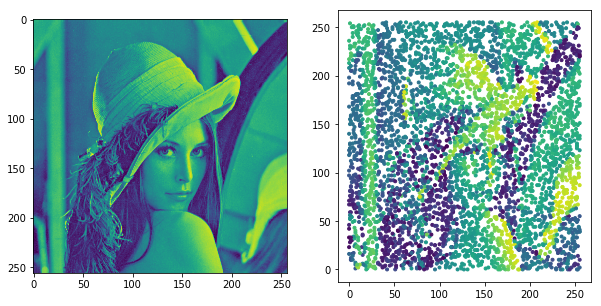

In [4]:
# 元データと訓練用点群の作図
visualization.plot_figures(data, X[:,0], X[:,1], Y[:]).show()

In [11]:
# Decision tree Regressionで回帰
from sklearn import tree
clf = tree.DecisionTreeRegressor(max_depth=30).fit(X,Y)
out = []
for _x in range(256):
    for _y in range(256):
        out.append([_x,_y,clf.predict([[_x,_y]])[0]])
outnp = np.array(out)

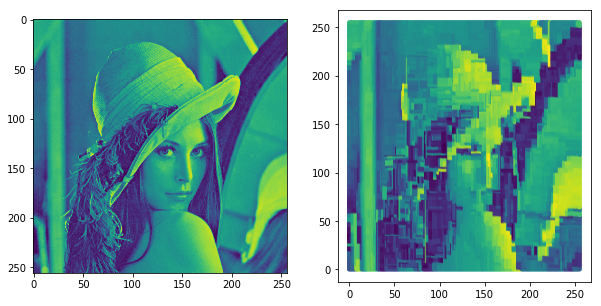

In [12]:
visualization.plot_figures(data, outnp[:,0], outnp[:,1], outnp[:,2]).show()

/opt/conda/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


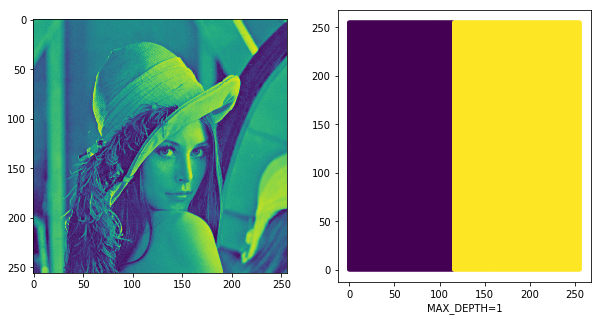

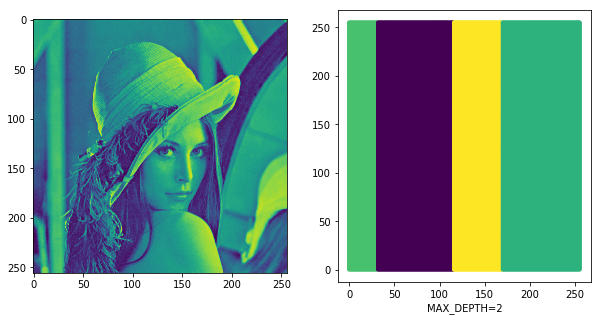

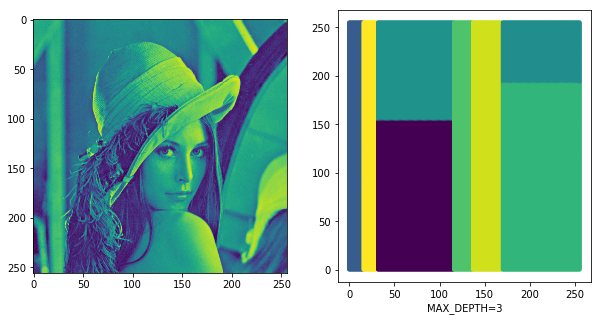

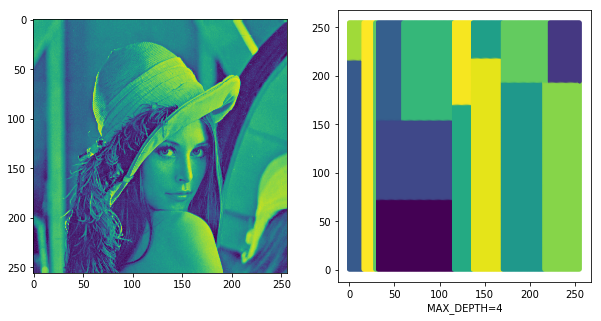

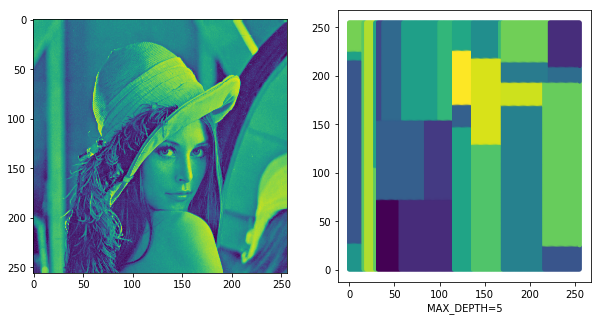

...

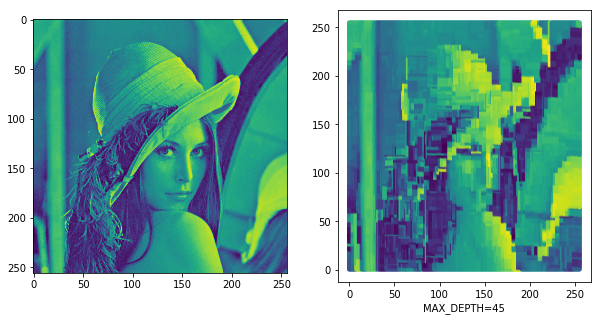

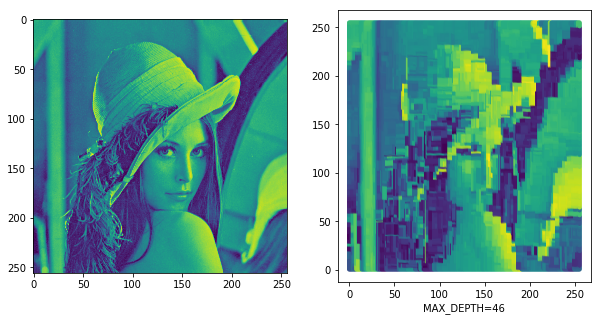

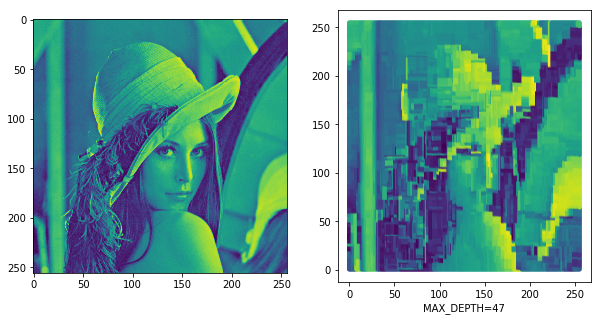

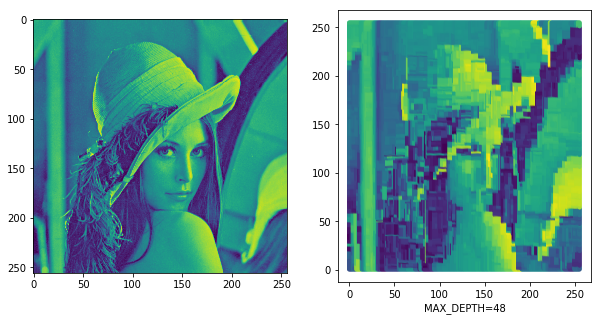

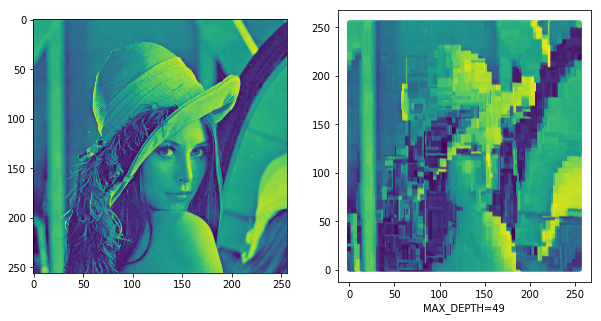

In [14]:
# MAX_DEPTHをいろいろ変えてみてみる
depth_candidate = [i for i in range(1,50)]
for i in range(len(depth_candidate)):
    clf = tree.DecisionTreeRegressor(max_depth=depth_candidate[i]).fit(X,Y)
    out = []
    for _x in range(256):
        for _y in range(256):
            out.append([_x,_y,clf.predict([[_x,_y]])[0]])
    outnp = np.array(out)
    visualization.plot_figures(data, outnp[:,0], outnp[:,1], outnp[:,2],
                              caption="MAX_DEPTH="+str(depth_candidate[i])).show()

In [7]:
# TODO: DBTでlenaたんの写真を学習し、領域プロット